In [24]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt       # Graphs and plots
import seaborn as sns
import folium                         # Maps
from folium.plugins import HeatMap    # I want to do a Heat Map
import plotly.express as px           # Interactive Plots and Maps

In [25]:
wego = pd.read_csv("C:/Users/user/workspace/c11/Python/projects/wego-wheely-wonka/additional/Headway Data, 8-1-2023 to 9-30-2023.csv")

wego.head()

,CALENDAR_ID,SERVICE_ABBR,ADHERENCE_ID,DATE,ROUTE_ABBR,BLOCK_ABBR,OPERATOR,TRIP_ID,OVERLOAD_ID,ROUTE_DIRECTION_NAME,TIME_POINT_ABBR,ROUTE_STOP_SEQUENCE,TRIP_EDGE,LATITUDE,LONGITUDE,SCHEDULED_TIME,ACTUAL_ARRIVAL_TIME,ACTUAL_DEPARTURE_TIME,ADHERENCE,SCHEDULED_HDWY,ACTUAL_HDWY,HDWY_DEV,ADJUSTED_EARLY_COUNT,ADJUSTED_LATE_COUNT,ADJUSTED_ONTIME_COUNT,STOP_CANCELLED,PREV_SCHED_STOP_CANCELLED,IS_RELIEF,DWELL_IN_MINS,SCHEDULED_LAYOVER_MINUTES
0,120230801,1,99457890,2023-08-01,22,2200,1040,345104,0,TO DOWNTOWN,MHSP,14.0,1,36.181248,-86.847705,2023-08-01 04:42:00,2023-08-01 04:37:38,2023-08-01 04:44:08,-2.133333,NaN,NaN,NaN,0,0,1,0,0.0,0,6.500000,NaN
1,120230801,1,99457891,2023-08-01,22,2200,1040,345104,0,TO DOWNTOWN,ELIZ,10.0,0,36.193454,-86.839981,2023-08-01 04:46:00,2023-08-01 04:48:27,2023-08-01 04:48:27,-2.450000,NaN,NaN,NaN,0,0,1,0,0.0,0,0.000000,NaN
2,120230801,1,99457892,2023-08-01,22,2200,1040,345104,0,TO DOWNTOWN,CV23,5.0,0,36.182177,-86.814445,2023-08-01 04:54:00,2023-08-01 04:54:56,2023-08-01 04:54:56,-0.933333,NaN,NaN,NaN,0,0,1,0,0.0,0,0.000000,NaN
3,120230801,1,99457893,2023-08-01,22,2200,1040,345104,0,TO DOWNTOWN,MCC5_10,1.0,2,36.167091,-86.781923,2023-08-01 05:10:00,2023-08-01 05:03:43,2023-08-01 05:03:43,6.283333,NaN,NaN,NaN,0,0,1,0,NaN,0,0.000000,NaN
4,120230801,1,99457894,2023-08-01,22,2200,1040,345105,0,FROM DOWNTOWN,MCC5_10,1.0,1,36.167091,-86.781923,2023-08-01 05:15:00,2023-08-01 05:03:43,2023-08-01 05:16:35,-1.583333,NaN,NaN,NaN,0,0,1,0,0.0,0,12.866666,5.0


In [26]:
wego['DATE'] = pd.to_datetime(wego['DATE']) # Convert DATE to datetime

In [27]:
pd.set_option('display.max_columns', None)
wego.head()

,CALENDAR_ID,SERVICE_ABBR,ADHERENCE_ID,DATE,ROUTE_ABBR,BLOCK_ABBR,OPERATOR,TRIP_ID,OVERLOAD_ID,ROUTE_DIRECTION_NAME,TIME_POINT_ABBR,ROUTE_STOP_SEQUENCE,TRIP_EDGE,LATITUDE,LONGITUDE,SCHEDULED_TIME,ACTUAL_ARRIVAL_TIME,ACTUAL_DEPARTURE_TIME,ADHERENCE,SCHEDULED_HDWY,ACTUAL_HDWY,HDWY_DEV,ADJUSTED_EARLY_COUNT,ADJUSTED_LATE_COUNT,ADJUSTED_ONTIME_COUNT,STOP_CANCELLED,PREV_SCHED_STOP_CANCELLED,IS_RELIEF,DWELL_IN_MINS,SCHEDULED_LAYOVER_MINUTES
0,120230801,1,99457890,2023-08-01,22,2200,1040,345104,0,TO DOWNTOWN,MHSP,14.0,1,36.181248,-86.847705,2023-08-01 04:42:00,2023-08-01 04:37:38,2023-08-01 04:44:08,-2.133333,NaN,NaN,NaN,0,0,1,0,0.0,0,6.500000,NaN
1,120230801,1,99457891,2023-08-01,22,2200,1040,345104,0,TO DOWNTOWN,ELIZ,10.0,0,36.193454,-86.839981,2023-08-01 04:46:00,2023-08-01 04:48:27,2023-08-01 04:48:27,-2.450000,NaN,NaN,NaN,0,0,1,0,0.0,0,0.000000,NaN
2,120230801,1,99457892,2023-08-01,22,2200,1040,345104,0,TO DOWNTOWN,CV23,5.0,0,36.182177,-86.814445,2023-08-01 04:54:00,2023-08-01 04:54:56,2023-08-01 04:54:56,-0.933333,NaN,NaN,NaN,0,0,1,0,0.0,0,0.000000,NaN
3,120230801,1,99457893,2023-08-01,22,2200,1040,345104,0,TO DOWNTOWN,MCC5_10,1.0,2,36.167091,-86.781923,2023-08-01 05:10:00,2023-08-01 05:03:43,2023-08-01 05:03:43,6.283333,NaN,NaN,NaN,0,0,1,0,NaN,0,0.000000,NaN
4,120230801,1,99457894,2023-08-01,22,2200,1040,345105,0,FROM DOWNTOWN,MCC5_10,1.0,1,36.167091,-86.781923,2023-08-01 05:15:00,2023-08-01 05:03:43,2023-08-01 05:16:35,-1.583333,NaN,NaN,NaN,0,0,1,0,0.0,0,12.866666,5.0


In [28]:
# Convert DATE column to datetime (if needed)
wego['DATE'] = pd.to_datetime(wego['DATE'], errors='coerce').dt.floor('s')

# Convert key timestamp columns to datetime, rounded to nearest second
wego['SCHEDULED_TIME'] = pd.to_datetime(wego['SCHEDULED_TIME'], errors='coerce').dt.floor('s')
wego['ACTUAL_ARRIVAL_TIME'] = pd.to_datetime(wego['ACTUAL_ARRIVAL_TIME'], errors='coerce').dt.floor('s')
wego['ACTUAL_DEPARTURE_TIME'] = pd.to_datetime(wego['ACTUAL_DEPARTURE_TIME'], errors='coerce').dt.floor('s')

# Extract hour (0–23) and day name (e.g. 'Tuesday')
wego['SCHED_HOUR'] = wego['SCHEDULED_TIME'].dt.hour
wego['ARRIVAL_HOUR'] = wego['ACTUAL_ARRIVAL_TIME'].dt.hour
wego['DEPARTURE_HOUR'] = wego['ACTUAL_DEPARTURE_TIME'].dt.hour

wego['SCHED_DAY'] = wego['SCHEDULED_TIME'].dt.day_name()
wego['ARRIVAL_DAY'] = wego['ACTUAL_ARRIVAL_TIME'].dt.day_name()
wego['DEPARTURE_DAY'] = wego['ACTUAL_DEPARTURE_TIME'].dt.day_name()

# Optional: Calculate delay in whole minutes
wego['ARRIVAL_DELAY_MIN'] = ((wego['ACTUAL_ARRIVAL_TIME'] - wego['SCHEDULED_TIME']).dt.total_seconds() / 60).round()
wego['DEPARTURE_DELAY_MIN'] = ((wego['ACTUAL_DEPARTURE_TIME'] - wego['SCHEDULED_TIME']).dt.total_seconds() / 60).round()

In [29]:
print(wego.columns.tolist())

['CALENDAR_ID', 'SERVICE_ABBR', 'ADHERENCE_ID', 'DATE', 'ROUTE_ABBR', 'BLOCK_ABBR', 'OPERATOR', 'TRIP_ID', 'OVERLOAD_ID', 'ROUTE_DIRECTION_NAME', 'TIME_POINT_ABBR', 'ROUTE_STOP_SEQUENCE', 'TRIP_EDGE', 'LATITUDE', 'LONGITUDE', 'SCHEDULED_TIME', 'ACTUAL_ARRIVAL_TIME', 'ACTUAL_DEPARTURE_TIME', 'ADHERENCE', 'SCHEDULED_HDWY', 'ACTUAL_HDWY', 'HDWY_DEV', 'ADJUSTED_EARLY_COUNT', 'ADJUSTED_LATE_COUNT', 'ADJUSTED_ONTIME_COUNT', 'STOP_CANCELLED', 'PREV_SCHED_STOP_CANCELLED', 'IS_RELIEF', 'DWELL_IN_MINS', 'SCHEDULED_LAYOVER_MINUTES', 'SCHED_HOUR', 'ARRIVAL_HOUR', 'DEPARTURE_HOUR', 'SCHED_DAY', 'ARRIVAL_DAY', 'DEPARTURE_DAY', 'ARRIVAL_DELAY_MIN', 'DEPARTURE_DELAY_MIN']


In [30]:
wego.dtypes

CALENDAR_ID                           int64
SERVICE_ABBR                          int64
ADHERENCE_ID                          int64
DATE                         datetime64[ns]
ROUTE_ABBR                            int64
BLOCK_ABBR                            int64
OPERATOR                              int64
TRIP_ID                               int64
OVERLOAD_ID                           int64
ROUTE_DIRECTION_NAME                 object
TIME_POINT_ABBR                      object
ROUTE_STOP_SEQUENCE                 float64
TRIP_EDGE                             int64
LATITUDE                            float64
LONGITUDE                           float64
SCHEDULED_TIME               datetime64[ns]
ACTUAL_ARRIVAL_TIME          datetime64[ns]
ACTUAL_DEPARTURE_TIME        datetime64[ns]
ADHERENCE                           float64
SCHEDULED_HDWY                      float64
ACTUAL_HDWY                         float64
HDWY_DEV                            float64
ADJUSTED_EARLY_COUNT            

#1. What is the overall on-time performance, and what do the overall distribution of adherence look like?

In [43]:
on_time = wego['ADHERENCE'].between(-5, 5)
on_time_rate = on_time.mean() * 100
print(f"Overall on-time performance: {on_time_rate:.2f}%")

Overall on-time performance: 73.58%


In [44]:
early = wego['ADHERENCE'] < -5
on_time = wego['ADHERENCE'].between(-5, 5)
late = wego['ADHERENCE'] > 5

total = len(wego['ADHERENCE'].dropna())

early_pct = early.sum() / total * 100
on_time_pct = on_time.sum() / total * 100
late_pct = late.sum() / total * 100

print(f"Early: {early_pct:.2f}%")
print(f"On Time: {on_time_pct:.2f}%")
print(f"Late: {late_pct:.2f}%")

Early: 22.31%
On Time: 76.07%
Late: 1.61%


In [ ]:
print(wego['ADH_CAT'].value_counts())


In [ ]:
print(wego[['ADJUSTED_LATE_COUNT', 'ADJUSTED_EARLY_COUNT', 'ADJUSTED_ONTIME_COUNT', 'TRIP_EDGE', 'ADH_CAT']].head(10))

In [67]:
for index, row in wego.iterrows():
    if row['ADJUSTED_LATE_COUNT'] > 0:
        wego.loc[index, 'ADH_CAT'] = 'late'
        print(f"Index {index}: late")
    elif row['ADJUSTED_EARLY_COUNT'] > 0:
        if row['TRIP_EDGE'] == 2:
            wego.loc[index, 'ADH_CAT'] = "on time"
            print(f"Index {index}: on time (edge 2 early)")
        else:
            wego.loc[index, 'ADH_CAT'] = 'early'
            print(f"Index {index}: early")
    elif row['ADJUSTED_ONTIME_COUNT'] > 0:
        wego.loc[index, 'ADH_CAT'] = 'on time'
        print(f"Index {index}: on time")


Index 0: on time
Index 1: on time
Index 2: on time
Index 3: on time
Index 4: on time
Index 5: on time
Index 6: on time
Index 7: on time
Index 8: on time
Index 9: on time
Index 10: on time
Index 11: on time
Index 12: early
Index 13: on time
Index 14: on time
Index 15: on time
Index 16: on time
Index 17: on time
Index 18: on time
Index 19: on time
Index 20: on time
Index 21: on time
Index 22: on time
Index 23: on time
Index 24: on time
Index 25: on time
Index 26: on time
Index 27: on time
Index 28: on time
Index 29: on time
Index 30: on time
Index 31: on time
Index 32: early
Index 33: on time
Index 34: on time
Index 35: on time
Index 36: on time
Index 37: on time
Index 38: early
Index 41: on time
Index 42: on time
Index 43: on time
Index 44: on time
Index 45: on time
Index 46: on time
Index 47: on time
Index 48: on time
Index 49: on time
Index 50: on time
Index 51: on time
Index 52: on time
Index 54: on time
Index 55: on time
Index 56: on time
Index 57: on time
Index 58: on time
Index 59

In [50]:
adh_counts = wego['ADH_CAT'].value_counts()
print(adh_counts)

ADH_CAT
on time    270790
late        59038
early        9033
Name: count, dtype: int64


In [46]:
wego['ADH_CAT'] = pd.cut(
    wego['ADHERENCE'],
    bins=[-float('inf'), -6, 1, float('inf')],
    labels=['early', 'on time', 'late']
)

In [ ]:
wego['ADHERENCE'].dropna().hist(bins=50, figsize=(10, 6), color='skyblue')
plt.title('Distribution of Adherence (minutes)')
plt.xlabel('Minutes early (-) or late (+)')
plt.ylabel('Number of stop events')
plt.grid(True)
plt.show()


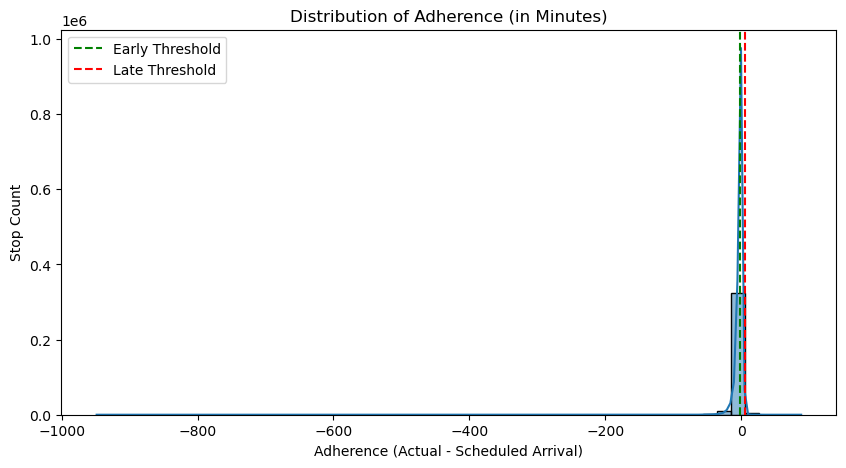

In [59]:

plt.figure(figsize=(10, 5))
sns.histplot(wego['ADHERENCE'], bins=50, kde=True)

# Threshold lines
plt.axvline(-1, color='green', linestyle='--', label='Early Threshold')
plt.axvline(5, color='red', linestyle='--', label='Late Threshold')

# Labels and title
plt.title('Distribution of Adherence (in Minutes)')
plt.xlabel('Adherence (Actual - Scheduled Arrival)')
plt.ylabel('Stop Count')
plt.legend()

plt.show()


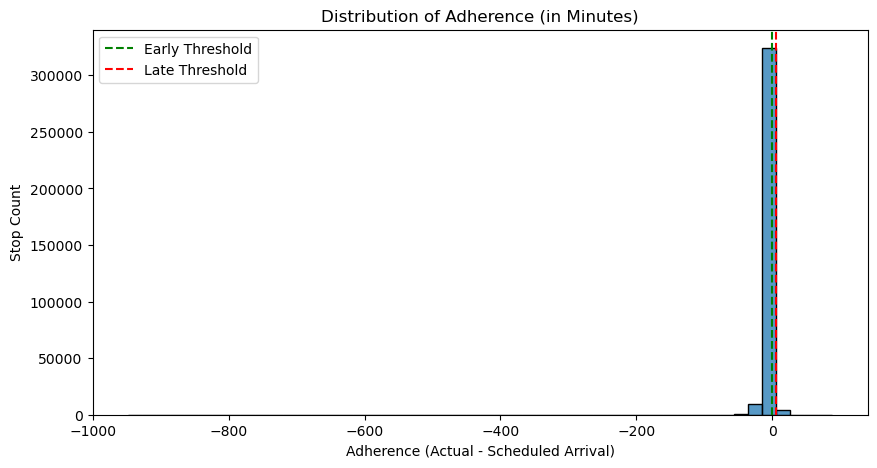

In [57]:
plt.figure(figsize=(10, 5))
sns.histplot(wego['ADHERENCE'], bins=50, stat='count')  # no kde
plt.axvline(-1, color='green', linestyle='--', label='Early Threshold')
plt.axvline(5, color='red', linestyle='--', label='Late Threshold')
plt.title('Distribution of Adherence (in Minutes)')
plt.xlabel('Adherence (Actual - Scheduled Arrival)')
plt.ylabel('Stop Count')
plt.legend()
plt.show()


In [32]:
wego['ON_TIME'] = wego['ADHERENCE'].between(-1, 5)


<Axes: xlabel='SCHED_HOUR'>

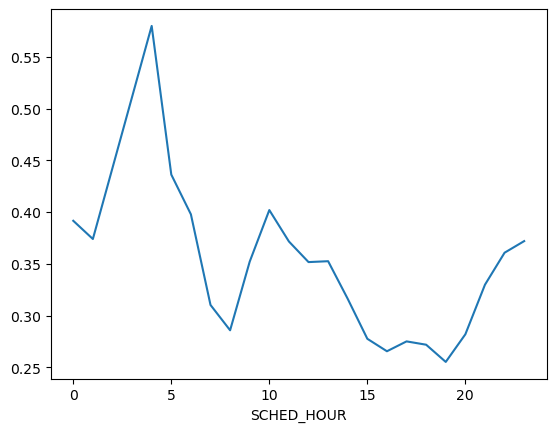

In [33]:
wego.groupby('SCHED_HOUR')['ON_TIME'].mean().plot()

#2. How does direction of travel, route, or location affect the on-time performance?

<Axes: xlabel='ROUTE_DIRECTION_NAME'>

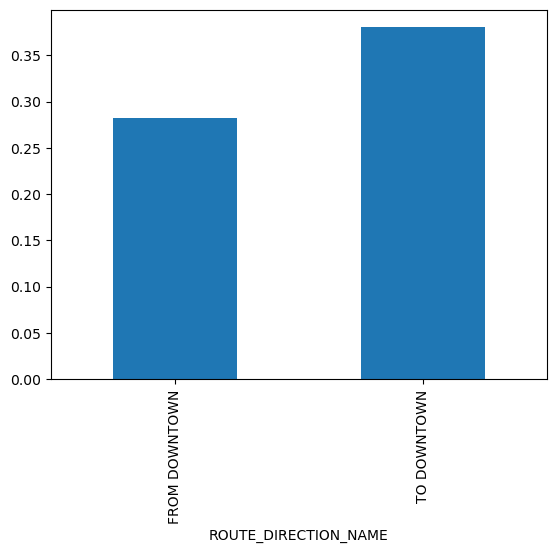

In [34]:
wego.groupby('ROUTE_DIRECTION_NAME')['ON_TIME'].mean().plot.bar()

<Axes: xlabel='ROUTE_ABBR'>

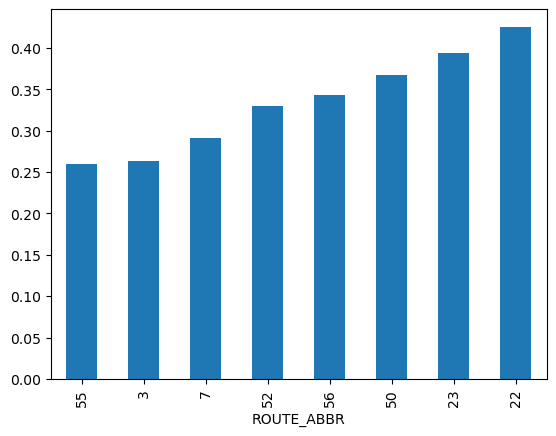

In [35]:
wego.groupby('ROUTE_ABBR')['ON_TIME'].mean().sort_values().plot.bar()

In [36]:
wego[['LATITUDE', 'LONGITUDE']].dropna().describe()

,LATITUDE,LONGITUDE
count,350329.000000,350329.000000
mean,36.158433,-86.769952
std,0.059113,0.065548
min,36.048934,-86.955657
25%,36.127172,-86.812719
50%,36.153870,-86.774535
75%,36.179753,-86.726914
max,36.307973,-86.636496


In [37]:
valid_routes = (
    wego.groupby('ROUTE_ABBR')[['LATITUDE', 'LONGITUDE']]
    .apply(lambda g: g.dropna().shape[0])
    .sort_values(ascending=False)
)

print(valid_routes.head(10))

ROUTE_ABBR
55    61944
56    60020
52    51819
3     47162
50    43291
23    42108
22    25959
7     18026
dtype: int64


In [38]:
print(wego['ROUTE_ABBR'].unique())


[22 23  3  7 50 52 55 56]


In [39]:
sample_route = wego[wego['ROUTE_ABBR'] == '52']
print(sample_route[['LATITUDE', 'LONGITUDE']].dropna().shape)


(0, 2)


In [40]:
route_id = '52'  # Replace with actual route
sample_route = wego[wego['ROUTE_ABBR'] == route_id]
coords = sample_route.sort_values('ROUTE_STOP_SEQUENCE')[['LATITUDE', 'LONGITUDE']].dropna().values.tolist()

if coords:
    m = folium.Map(location=[36.15, -86.75], zoom_start=13)
    folium.PolyLine(coords, tooltip=f'Route {52}', color='blue').add_to(m)
    folium.Marker(location=coords[0], tooltip='Start').add_to(m)
    folium.Marker(location=coords[-1], tooltip='End').add_to(m)
    m
else:
    print(f"No coordinates found for Route {52}")


No coordinates found for Route 52


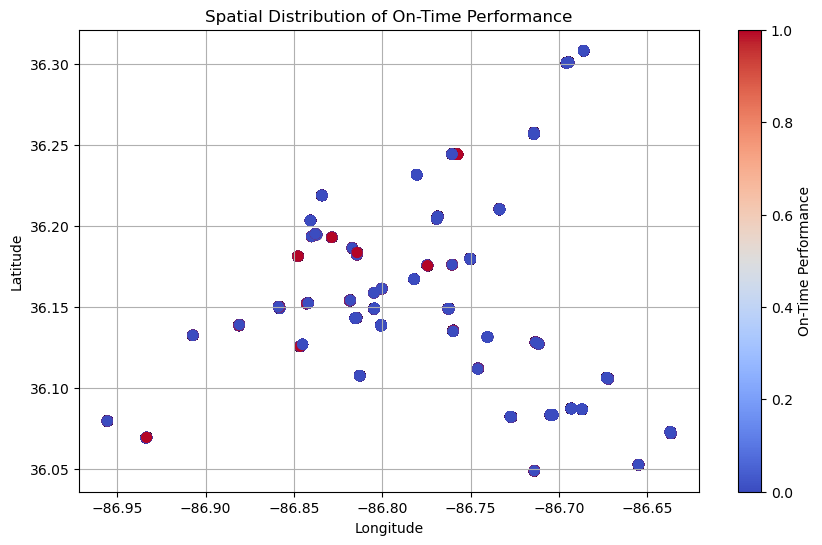

In [41]:
plt.figure(figsize=(10, 6))
plt.scatter(wego['LONGITUDE'], wego['LATITUDE'], c=wego['ON_TIME'], cmap='coolwarm', s=50)
plt.colorbar(label='On-Time Performance')
plt.title('Spatial Distribution of On-Time Performance')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True)
plt.show()
#- Red zones → low adherence
#- Blue zones → high adherence


In [42]:
wego.groupby(['ROUTE_DIRECTION_NAME', 'ZONE'])['ON_TIME'].mean().unstack().plot()

KeyError: 'ZONE'

In [ ]:
wego['ON_TIME'] = wego['ADHERENCE'].between(-1, 5)

In [ ]:
wego.sort_values('ROUTE_STOP_SEQUENCE').plot.scatter(
    x='LONGITUDE', y='ON_TIME', c='ROUTE_STOP_SEQUENCE', cmap='viridis', s=40
)

#3. How does time of day or day of week affect on-time performance?

#4 How much of a factor does the driver have on on-time performance? The driver is indicated by the OPERATOR variable.

#5 Is there any relationship between lateness (ADHERENCE) and headway deviation? The headway deviation variable is contained in the HDWY_DEV column. See the notes under number 9 for a description of headway and headway deviation.

#6 How much impact does being late or too spaced out at the first stop have downstream?

#7 What is the impact of the layover at the start of the trip (the difference between the first stop arrival and departure time)? Does more dwell time at the beginning of a trip lead to more stable headways (lower values for % headway deviation)? Do trips with longer scheduled layover time have more stable headway values?

#8 What is the relationship between distance or time traveled since the start of a given trip and the adherence value? Does on-time performance become less stable the further along the route the bus has traveled?

<Axes: xlabel='ROUTE_STOP_SEQUENCE'>

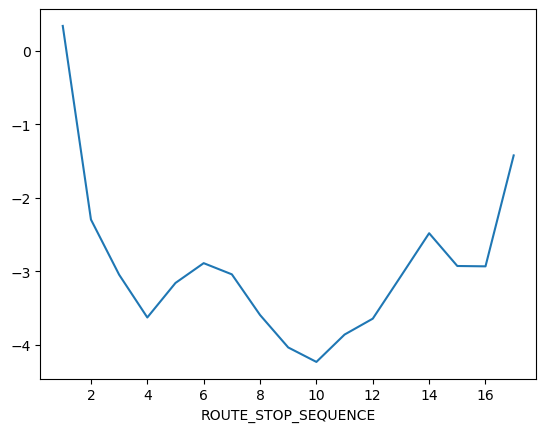

In [60]:
wego.groupby('ROUTE_STOP_SEQUENCE')['ADHERENCE'].mean().plot()

In [61]:
wego['ELAPSED_MIN'] = (wego['ACTUAL_ARRIVAL_TIME'] - wego.groupby('TRIP_ID')['ACTUAL_ARRIVAL_TIME'].transform('min')).dt.total_seconds() / 60

<Axes: xlabel='ELAPSED_MIN'>

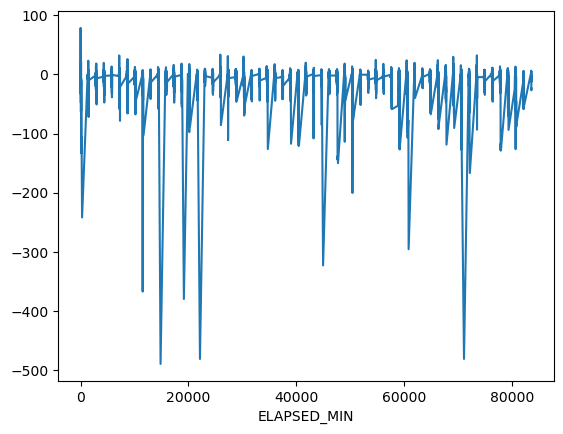

In [62]:
wego.groupby('ELAPSED_MIN')['ADHERENCE'].mean().plot()

<Axes: xlabel='ROUTE_STOP_SEQUENCE'>

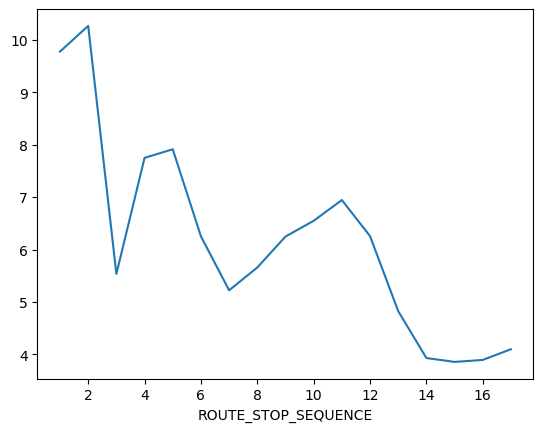

In [63]:
wego.groupby('ROUTE_STOP_SEQUENCE')['ADHERENCE'].std().plot()

<Axes: xlabel='ROUTE_STOP_SEQUENCE'>

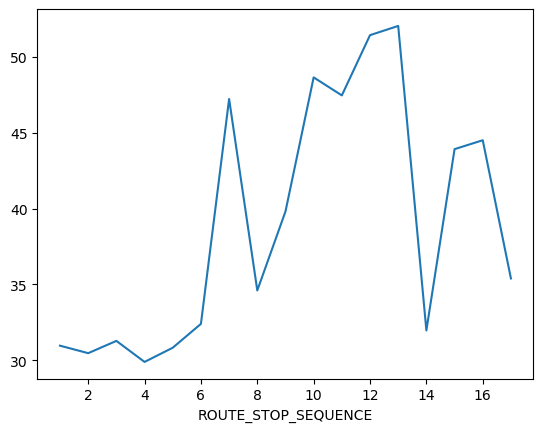

In [64]:
wego['DRIFT'] = (wego['ACTUAL_ARRIVAL_TIME'] - wego['SCHEDULED_TIME']).dt.total_seconds() / 60
wego.groupby('ROUTE_STOP_SEQUENCE')['DRIFT'].mean().plot()

In [65]:
wego.groupby(['SCHED_DAY', 'TRIP_SEGMENT'])['ADHERENCE'].mean().unstack().plot()

KeyError: 'TRIP_SEGMENT'

#9 Headway is the amount of time between a bus and the prior bus at the same stop. In the dataset, the amount of headway scheduled is contained in the SCHEDULED_HDWY column and indicates the difference between the scheduled time for a particular stop and the scheduled time for the previous bus on that same stop. This dataset contains a column HDWY_DEV, which shows the amount of deviation from the scheduled headway. Bunching occurs when there is shorter headway than scheduled, which would appear as a negative HDWY_DEV value. Gapping is when there is more headway than scheduled and appears as a positive value in the HDWY_DEV column. Note that you can calculate headway deviation percentage as HDWY_DEV/SCHEDULED_HDWY. The generally accepted range of headway deviation is 50% to 150% of the scheduled headway, so if scheduled headway is 10 minutes, a headway deviation of up to 5 minutes would be acceptable (but not ideal). How do the variables studied related to headway deviation?

In [21]:

# Grab the first 10 valid coordinates
sample = wego[['LATITUDE', 'LONGITUDE']].dropna().head(10)

# Create a map centered on Nashville
m = folium.Map(location=[36.15, -86.75], zoom_start=13)

# Add markers for each stop
for _, row in sample.iterrows():
    folium.Marker(location=[row['LATITUDE'], row['LONGITUDE']]).add_to(m)

m

In [19]:

# Grab all valid coordinates
valid_coords = wego[['LATITUDE', 'LONGITUDE']].dropna()

# Create map
m = folium.Map(location=[36.15, -86.75], zoom_start=12)

# Add all stops as small blue dots
for _, row in valid_coords.iterrows():
    folium.CircleMarker(
        location=[row['LATITUDE'], row['LONGITUDE']],
        radius=2,
        color='blue',
        fill=True,
        fill_opacity=0.6
    ).add_to(m)
m.save('nashville_map.html')


In [20]:

# Create a map centered on Nashville
m = folium.Map(location=[36.15, -86.75], zoom_start=13)

# Add a single marker
folium.Marker(location=[36.15, -86.75], tooltip='Center of Nashville').add_to(m)

# Display the map
m